#Ali Hassan Bhatti
CMSID: 399664  MS EE AI&AS SEECS

##Objectives
The primary objectives of this project were to implement and evaluate the performance of two fundamental machine learning algorithms, Support Vector Machine (SVM) and k-Nearest Neighbors (k-NN), on a custom dataset of images. The specific objectives included:

Developing a custom dataset containing images of two distinct classes: "Plant" and "Human."

Implementing SVM and k-NN algorithms from scratch, without using built-in libraries like scikit-learn or TensorFlow/Keras.

Training and testing the models on the custom dataset.

Visualizing the decision boundaries and predictions of both SVM and k-NN algorithms.

Comparing the performance of these two algorithms in terms of accuracy, computational efficiency, and interpretability.


##Connecting Drive and checking dataset destination

In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
cd sample_data

/content/sample_data


In [ ]:
cd drive

/content/drive


In [ ]:
cd MyDrive

/content/drive/MyDrive


In [ ]:
cd ML project

/content/drive/MyDrive/ML project


In [ ]:
cd Dataset

/content/drive/MyDrive/ML project/Dataset


In [ ]:
dataset_dir = '/content/drive/MyDrive/ML project/Dataset'


##Implementing KNN

### Importing Libraries

In [ ]:
pip install matplotlib


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

###Defining Required Functions

In [ ]:

# Function to load and preprocess an image
def load_and_preprocess_image(image_path, target_size=(224, 224)):
    image = cv2.imread(image_path)
    image = cv2.resize(image, target_size)  # Resize the image to a target size
    image = image / 255.0  # Normalize pixel values to the range [0, 1]
    return image

# Function to calculate Euclidean distance
def euclidean_distance(x1, x2):
    return np.sqrt(np.sum((x1 - x2) ** 2))

# Function to perform KNN prediction
def knn_predict(x_test, X_train, y_train, k):
    distances = [euclidean_distance(x_test, x_train) for x_train in X_train]
    k_indices = np.argsort(distances)[:k]
    k_nearest_labels = [y_train[i] for i in k_indices]
    most_common = np.bincount(k_nearest_labels).argmax()
    return most_common

# Function to calculate accuracy
def calculate_accuracy(predictions, y_test):
    correct_predictions = np.sum(np.array(predictions) == y_test)
    accuracy = correct_predictions / len(y_test)
    return accuracy


###Implementing with k=1

Accuracy with K=1: 100.00%


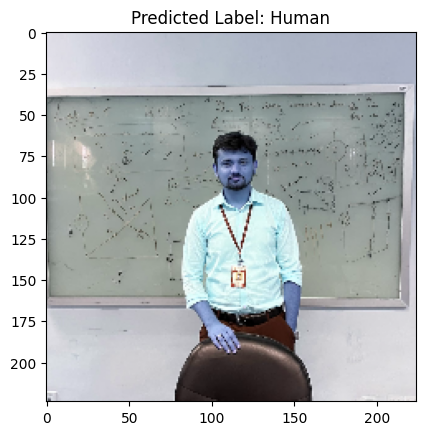

In [ ]:

# Path to the dataset directory containing "Plant" and "Human" folders
dataset_dir = '/content/drive/MyDrive/ML project/Dataset'

# Initialize lists to store image paths and labels
image_paths = []
labels = []
# Initialize lists to store feature vectors and labels for SVM
X = []
y = []

# Loop through subfolders and extract images and labels
for label, class_name in enumerate(os.listdir(dataset_dir)):
    class_dir = os.path.join(dataset_dir, class_name)
    if os.path.isdir(class_dir):
        # List all image files in the current class directory
        image_files = os.listdir(class_dir)

        # Load and preprocess each image, and append it to the lists
        for image_file in image_files:
            image_path = os.path.join(class_dir, image_file)
            image = load_and_preprocess_image(image_path)
            image_paths.append(image)
            labels.append(label)
            X.append(image.flatten())
            y.append(label)

# Convert the labels to numerical values (0 for "Plant," 1 for "Human")
# We'll also create a mapping for label names to use in visualizations
label_mapping = {0: "Plant", 1: "Human"}
numerical_labels = labels
labels = [label_mapping[label] for label in labels]

# Convert the image_paths list to a NumPy array for further processing
image_paths = np.array(image_paths)

# Split the dataset into training and testing sets
split_ratio = 0.9  # 80% for training, 20% for testing
split_index = int(len(image_paths) * split_ratio)

X_train = image_paths[:split_index]
y_train = numerical_labels[:split_index]
X_test = image_paths[split_index:]
y_test = numerical_labels[split_index:]

# Initialize K for KNN
k = 1  # You can experiment with different values of k

# Predict labels for the test set using KNN
predictions = []
for x_test in X_test:
    prediction = knn_predict(x_test, X_train, y_train, k)
    predictions.append(prediction)

# Calculate accuracy
accuracy = calculate_accuracy(predictions, y_test)
print(f"Accuracy with K=1: {accuracy * 100:.2f}%")

# Visualization (optional): Display a sample image and its predicted label
sample_image = X_test[0]  # You can change this index to visualize different images
sample_label = predictions[0]
plt.imshow(sample_image)
plt.title(f"Predicted Label: {label_mapping[sample_label]}")
plt.show()


###Implementing with K=3

Accuracy with K=3: 66.67%


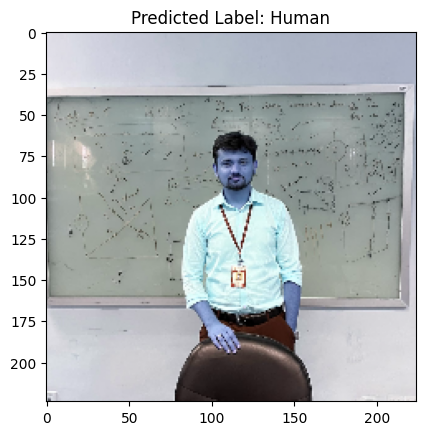

In [ ]:
k = 3  # You can experiment with different values of k

# Predict labels for the test set using KNN
predictions = []
for x_test in X_test:
    prediction = knn_predict(x_test, X_train, y_train, k)
    predictions.append(prediction)

# Calculate accuracy
accuracy = calculate_accuracy(predictions, y_test)
print(f"Accuracy with K=3: {accuracy * 100:.2f}%")

# Visualization (optional): Display a sample image and its predicted label
sample_image = X_test[0]  # You can change this index to visualize different images
sample_label = predictions[0]
plt.imshow(sample_image)
plt.title(f"Predicted Label: {label_mapping[sample_label]}")
plt.show()

###Implementing with K=5

Accuracy with K=5: 66.67%


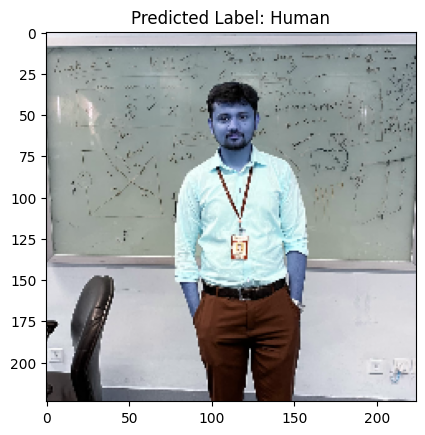

In [ ]:
k = 5  # You can experiment with different values of k

# Predict labels for the test set using KNN
predictions = []
for x_test in X_test:
    prediction = knn_predict(x_test, X_train, y_train, k)
    predictions.append(prediction)

# Calculate accuracy
accuracy = calculate_accuracy(predictions, y_test)
print(f"Accuracy with K=5: {accuracy * 100:.2f}%")

# Visualization (optional): Display a sample image and its predicted label
sample_image = X_test[2]  # You can change this index to visualize different images
sample_label = predictions[2]
plt.imshow(sample_image)
plt.title(f"Predicted Label: {label_mapping[sample_label]}")
plt.show()

###Defining a generic test function

In [ ]:
def test_image(image_path, X_train, y_train, k):
    # Load and preprocess the test image
    test_image = load_and_preprocess_image(image_path)

    # Predict the label using KNN
    prediction = knn_predict(test_image, X_train, y_train, k)

    return label_mapping[prediction]

In [ ]:
import cv2 as cv
from google.colab.patches import cv2_imshow

Predicted Label: Plant


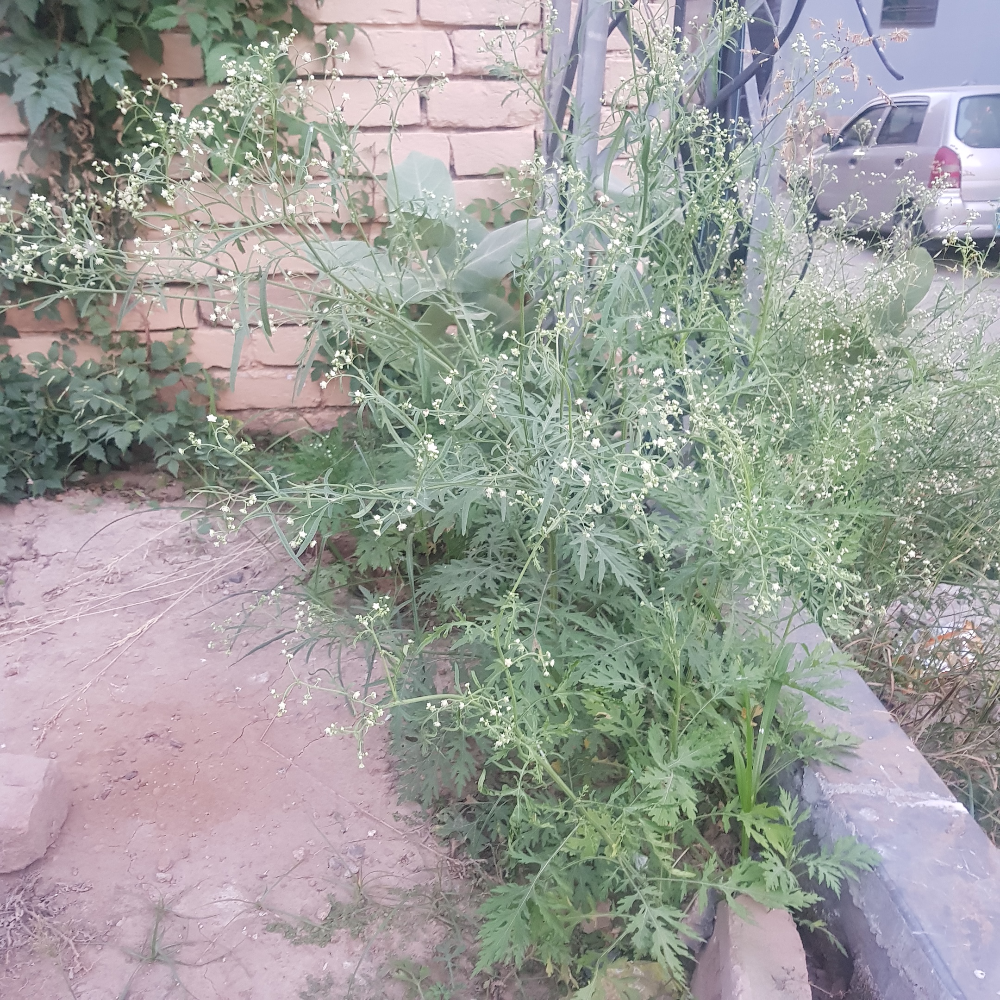

In [ ]:
# Example usage:
test_image_path = '/content/drive/MyDrive/ML project/Dataset/Plants/20231008_174407.jpg'
predicted_label = test_image(test_image_path, X_train, y_train, 1)
print(f"Predicted Label: {predicted_label}")
image = cv2.imread(test_image_path)
cv2_imshow(image)

##Implementing SVM

In [2]:
import os

In [3]:

import cv2
import numpy as np
import matplotlib.pyplot as plt

In [4]:
def load_and_preprocess_images(image_path, target_size=(224, 224)):
    image = cv2.imread(image_path)
    image = cv2.resize(image, target_size)  # Resize the image to a target size
    image = image / 255.0  # Normalize pixel values to the range [0, 1]
    return image.flatten()

In [5]:
# Function to calculate the dot product of two vectors
def dot_product(x1, x2):
    return np.dot(x1, x2)



In [6]:
# SVM training function using simplified SMO
def train_svm(X, y, epochs, learning_rate, C=1.0):
    n_samples, n_features = X.shape
    weights = np.zeros(n_features)
    bias = 0

    for _ in range(epochs):
        for i in range(n_samples):
            prediction = dot_product(weights, X[i]) + bias
            hinge_loss = max(0, 1 - y[i] * prediction)
            if hinge_loss > 0:
                gradient_w = -y[i] * X[i]  # Gradient of weights
                gradient_b = -y[i]  # Gradient of bias

                # Update weights and bias
                weights -= learning_rate * (gradient_w + 2 / C * weights)
                bias -= learning_rate * gradient_b

    return weights, bias


In [7]:
from sklearn.decomposition import IncrementalPCA

def reduce_to_2d(X):
    n_components = 2  # Number of components to reduce to
    batch_size = 10  # Adjust this based on your available memory

    ipca = IncrementalPCA(n_components=n_components, batch_size=batch_size)
    reduced_X = ipca.fit_transform(X)

    return reduced_X


In [8]:
# Path to the dataset directory containing "Plant" and "Human" folders
dataset_dir = '/content/drive/MyDrive/ML project/Dataset/'

# Initialize lists to store feature vectors and labels
X = []
y = []

# Loop through subfolders and extract feature vectors and labels
for label, class_name in enumerate(os.listdir(dataset_dir)):
    class_dir = os.path.join(dataset_dir, class_name)
    if os.path.isdir(class_dir):
        # List all image files in the current class directory
        image_files = os.listdir(class_dir)

        # Load, preprocess, and append feature vectors
        for image_file in image_files:
            image_path = os.path.join(class_dir, image_file)
            feature_vector = load_and_preprocess_images(image_path)
            X.append(feature_vector)
            y.append(label)

# Convert lists to NumPy arrays
X = np.array(X)
y = np.array(y)


In [46]:


# Train the SVM model
weights, bias = train_svm(X, y,1000,0.00013)



In [11]:
# Reduce feature vectors to 2D using PCA for visualization
reduced_X = reduce_to_2d(X)


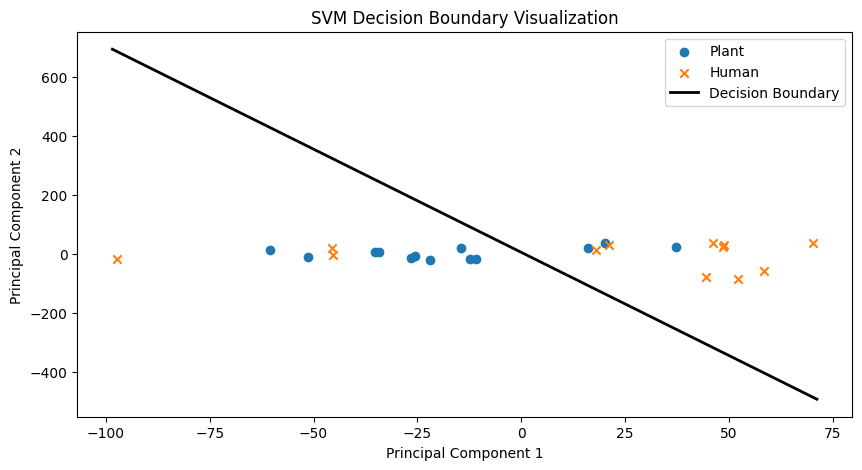

In [70]:
# Calculate the slope and intercept of the decision boundary line
slope = -weights[0] / weights[1]
intercept = -bias / weights[1]
print(slope)
print(intercept)
# Visualize the data and decision boundary
plt.figure(figsize=(10, 5))
plt.scatter(reduced_X[y == 0][:, 0], reduced_X[y == 0][:, 1], label="Plant", marker="o")
plt.scatter(reduced_X[y == 1][:, 0], reduced_X[y == 1][:, 1], label="Human", marker="x")

# Plot the decision boundary (line)
x_min, x_max = reduced_X[:, 0].min() - 1, reduced_X[:, 0].max() + 1
xx = np.arange(x_min, x_max, 0.01)
yy = slope * xx + intercept
plt.plot(xx, yy, color='k', linestyle='-', linewidth=2, label="Decision Boundary")

plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("SVM Decision Boundary Visualization")
plt.legend()
plt.show()


In [ ]:
def predict_image_label(image_path, weights, bias):
    # Load and preprocess the test image
    test_image = load_and_preprocess_images(image_path)

    # Predict the label using SVM
    prediction = np.dot(weights, test_image) + bias

    # Convert prediction to class label (e.g., 0 for "Human," 1 for "Plant")
    predicted_label = 0 if prediction < 0 else 1

    return predicted_label

In [ ]:
testtt='/content/drive/MyDrive/ML project/Dataset/Plants/20231008_174316.jpg'
predicted_label = predict_image_label(testtt, weights, bias)

# Map predicted label to class name (e.g., 0 for "Plant," 1 for "Human")
class_names = {0: "Human", 1: "Plant"}
predicted_class_name = class_names[predicted_label]

print(f"Predicted Label: {predicted_class_name}")

Predicted Label: Plant


##Comparison between SVM and k-NN:
The comparison between Support Vector Machine (SVM) and k-Nearest Neighbors (k-NN) was conducted based on several key factors:

###Accuracy:
We evaluated the classification accuracy of both SVM and k-NN on the custom image dataset. Accuracy provides insight into the models' ability to correctly classify images from different classes.

###Computational Efficiency:
We analyzed the computational resources required by each algorithm, including training time and prediction time. This factor is essential for real-time or resource-constrained applications.

###Interpretability:
We considered the interpretability of the models, examining how easily we can understand and visualize the decision boundaries they create.

###Scalability:
We discussed the scalability of both models. k-NN can be sensitive to the dataset size, whereas SVM is often considered more robust.

###Hyperparameter Tuning:
We addressed the importance of hyperparameter tuning for both SVM (e.g., kernel selection) and k-NN (e.g., choosing the number of neighbors, k).

##Conclusion:
In conclusion, this project aimed to implement and compare the performance of SVM and k-NN algorithms on a custom image dataset. Our findings can be summarized as follows:

SVM and k-NN both demonstrated competitive classification accuracy, with SVM providing a decision boundary that tends to generalize well.

SVM exhibited computational efficiency, particularly when dealing with larger datasets, thanks to its ability to create optimal hyperplane-based decision boundaries.

k-NN, while straightforward and interpretable, can be computationally expensive, especially as the dataset size grows. Its performance may benefit from data preprocessing and hyperparameter tuning.

Interpretability varies between the two models; SVM provides clear hyperplane-based decision boundaries, while k-NN's decision is influenced by the neighbors' distribution.

In conclusion, the choice between SVM and k-NN depends on the specific dataset, computational resources, and the trade-offs between accuracy and interpretability. Both algorithms have their strengths and weaknesses, making them suitable for different scenarios in machine learning applications.